In [ ]:
import shap
import xgboost

import pandas as pd
import matplotlib.pyplot as plt

import numpy as np
import bench

from sklearn.preprocessing import FunctionTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import make_pipeline

In [10]:
import mpl_fontkit as fk

# https://fonts.google.com/specimen/Lato?query=Lato
fk.install("Roboto Slab")
fk.set_font("Roboto Slab")
plt.rcParams["figure.dpi"] = 300
plt.rcParams["figure.figsize"] = (3, 3)

Font name: `Roboto Slab`


In [4]:
train_df = pd.read_csv("ovid_voice_train.csv")
eval_df = pd.read_csv("ovid_voice_eval.csv")

In [ ]:
bitri = make_pipeline(
    CountVectorizer(
        lowercase=False,
        analyzer="word",
        tokenizer=lambda x: x.split(" "),
        token_pattern=None,
        ngram_range=(2, 3),
        max_features=1000,
    ),
    FunctionTransformer(lambda x: np.array(x.todense()), accept_sparse=True),
)
bitri.fit(pd.concat([eval_df["masked"], train_df["masked"]]))

unigrams = make_pipeline(
    CountVectorizer(
        lowercase=False,
        analyzer="word",
        tokenizer=lambda x: x.split(" "),
        token_pattern=None,
    ),
    FunctionTransformer(lambda x: np.array(x.todense()), accept_sparse=True),
)
unigrams.fit(pd.concat([eval_df["feats"], train_df["feats"]]))


def maskvec(
    df: pd.DataFrame,
    groups: list[str],
    start_col: int = 4,
    squish=1,
    scale=True,
    norm=True,
) -> pd.DataFrame:
    """
    Generate a combined DataFrame by scaling and normalizing specific groups of features.

    This function processes a DataFrame by applying scaling and normalization to different feature
    groups and then combines the processed groups into a single DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame containing raw data to be processed. squish (int,
        optional): A parameter to control the squishing factor during scaling. Defaults to 1. scale
        (bool, optional): Whether to apply scaling to the feature groups. Defaults to True. norm
        (bool, optional): Whether to apply normalization to the feature groups. Defaults to True.

    Returns:
        pd.DataFrame: A DataFrame containing the combined and processed feature groups.
    """
    posunibi = bench.df_scale_group(
        df,
        bitri,
        "masked",
        groups=groups,
        start_col=start_col,
        squish=squish,
        scale=scale,
        norm=norm,
        fit=False,
    )
    feats = bench.df_scale_group(
        df,
        unigrams,
        "feats",
        groups=groups,
        start_col=start_col,
        squish=squish,
        scale=scale,
        norm=norm,
        fit=False,
    ).iloc[:, start_col + 1 :]
    combined = pd.concat([posunibi, feats], axis=1)
    return combined

In [6]:
unibi = make_pipeline(
    CountVectorizer(
        lowercase=False,
        analyzer="word",
        tokenizer=lambda x: x.split(" "),
        token_pattern=None,
        ngram_range=(1, 2),
        max_features=5000,
    ),
    FunctionTransformer(lambda x: np.array(x.todense()), accept_sparse=True),
)
unibi.fit(pd.concat([eval_df["lemmata"], train_df["lemmata"]]))


def lemmavec(
    df: pd.DataFrame,
    groups: list[str],
    start_col: int = 4,
    squish=1,
    scale=True,
    norm=True,
) -> pd.DataFrame:
    """

    Args:
        df (pd.DataFrame): The input DataFrame containing raw data to be processed.
        squish (int, optional): A parameter to control the squishing factor during scaling. Defaults to 1.
        scale (bool, optional): Whether to apply scaling to the feature groups. Defaults to True.
        norm (bool, optional): Whether to apply normalization to the feature groups. Defaults to True.

    Returns:
        pd.DataFrame: A DataFrame containing the combined and processed feature groups.
    """
    lemmataunibi = bench.df_scale_group(
        df,
        unibi,
        "lemmata",
        groups=groups,
        start_col=start_col,
        squish=squish,
        scale=scale,
        norm=norm,
        fit=False,
    )

    return lemmataunibi

2. Syntax benchmark

In [17]:
xgb = xgboost.XGBClassifier(
    learning_rate=0.2,
    n_estimators=150,
    max_depth=8,
    min_child_weight=1,
    gamma=0,
    colsample_bytree=0.5,
    colsample_bylevel=0.5,
    colsample_bynode=0.5,
    objective="binary:logistic",
    eval_metric="logloss",
    nthread=10,
    scale_pos_weight=1,
    seed=42,
)

In [8]:
train_df.head(3)

,title,speaker,sentence,text,masked,POS,feats,lemmata
0,Heroides 1,female,Heroides 1-0,"Haec tua Penelope lento tibi mittit, Ulixe\n n...",haec tua PROPN ADJ tibi VERB PROPN (EOL) nil m...,DET DET PROPN ADJ PRON VERB PROPN <EOL> PRON P...,Case=Acc Gender=Neut Number=Plur PronType=Dem ...,hic tuus PROPN lentus tu mitto PROPN (EOL) nih...
1,Heroides 1,female,Heroides 1-1,"Troja jacet certe, Danais invisa puellis;\n",PROPN VERB certe ADJ ADJ NOUN (EOL) (EOS),PROPN VERB ADV ADJ ADJ NOUN <EOL> <EOS>,Case=Nom Gender=Fem Number=Sing Mood=Ind Numbe...,PROPN jaceo certe danaus invisus puella (EOL) ...
2,Heroides 1,female,Heroides 1-2,vix Priamus tanti totaque Troja fuit.\n,vix PROPN tanti tota que PROPN fuit (EOL) (EOS),ADV PROPN DET DET CCONJ PROPN AUX <EOL> <EOS>,Case=Nom Gender=Masc Number=Sing Case=Gen Gend...,vix PROPN tantus totus que PROPN sum (EOL) (EOS)


# Create the masked corpora to interpret

In [18]:
masked_corpora = {}
for squish in [1, 2, 5, 10, 20, 25]:
    corpus = bench.vectorize_squish(
        train_df,
        fn=maskvec,
        groups=["title"],
        start_col=3,
        squish=squish,
        norm=True,
        scale=True,
    ).reset_index(drop=True)
    (_, X, y), report = bench.bench_and_fit(
        corpus.copy(), xgb, quiet=True, y_col="speaker", start_col=4
    )
    masked_corpora[squish] = {"corpus": corpus, "X": X, "y": y}

## Beeswarm plots of most relevant features

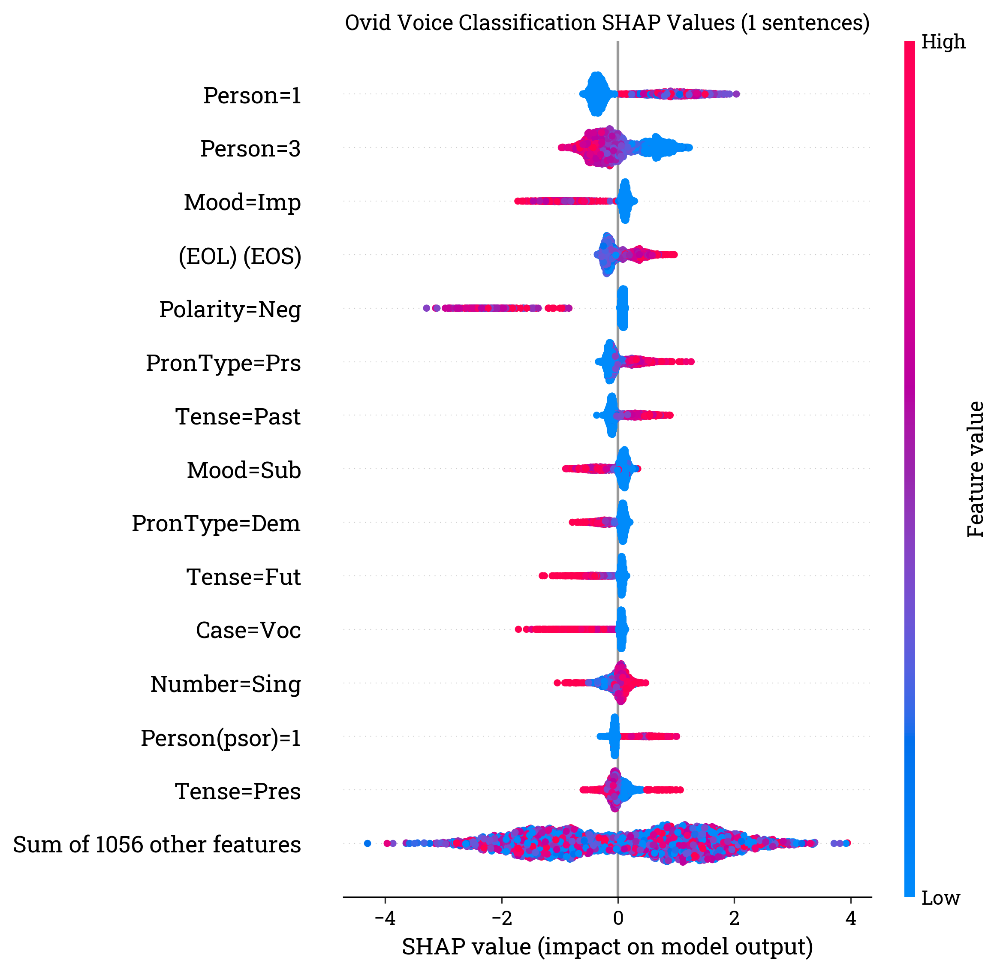

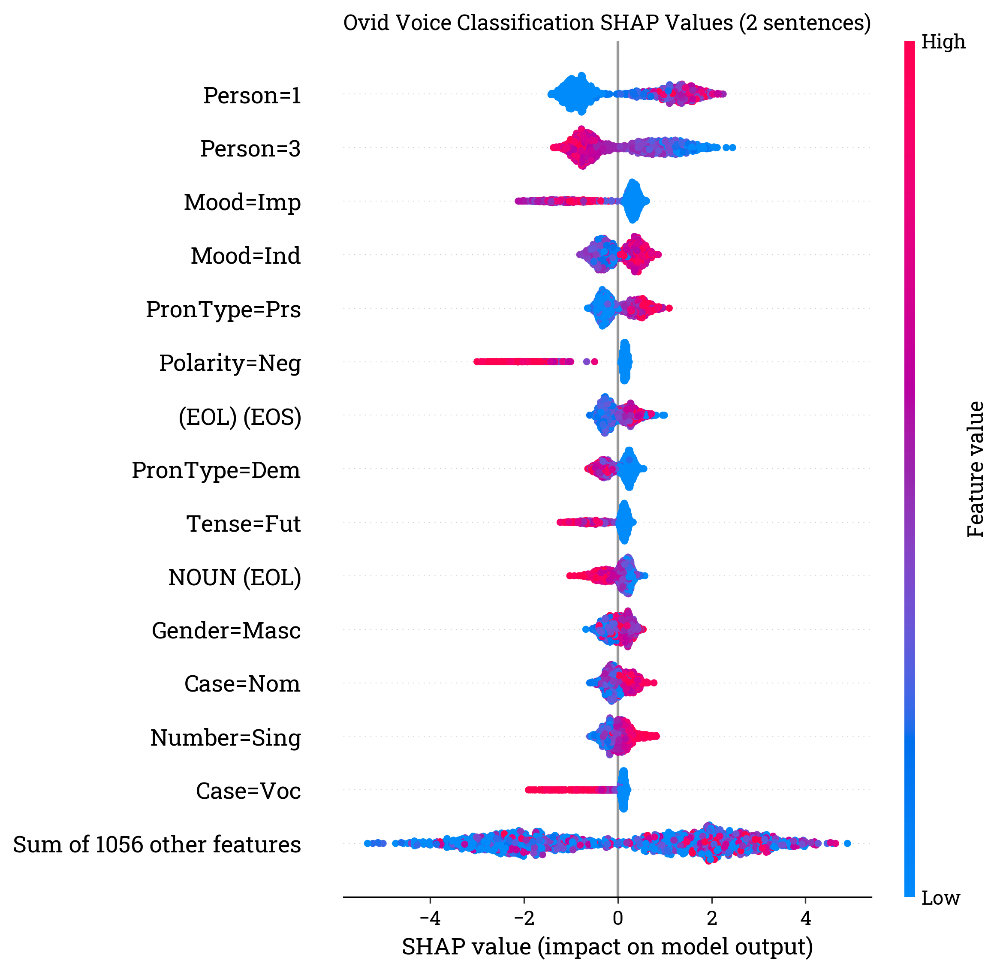

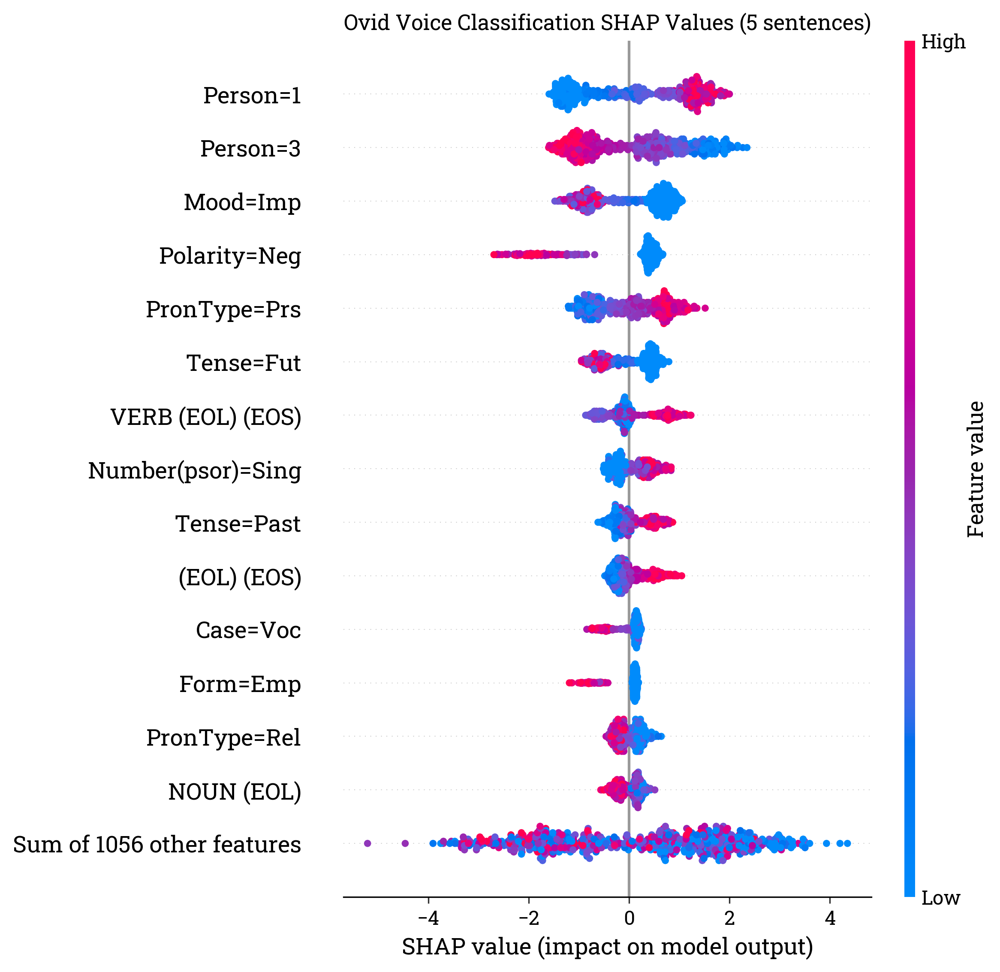

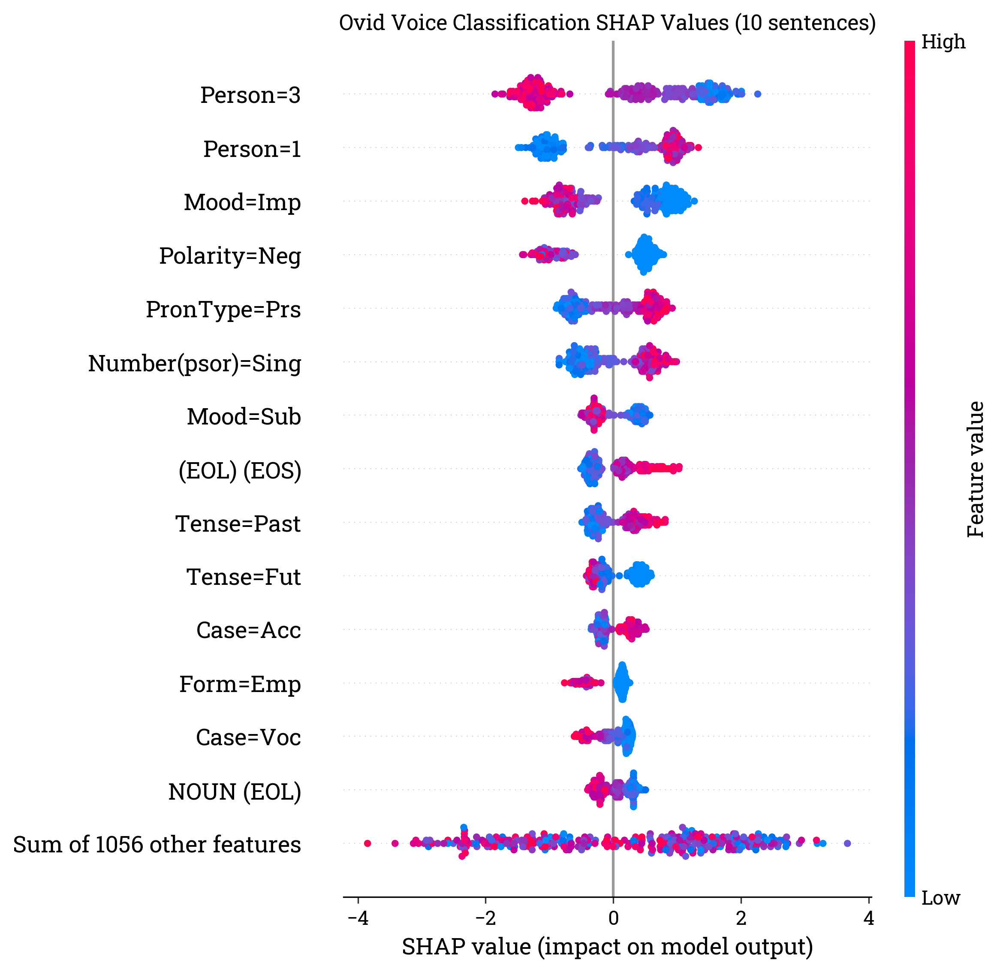

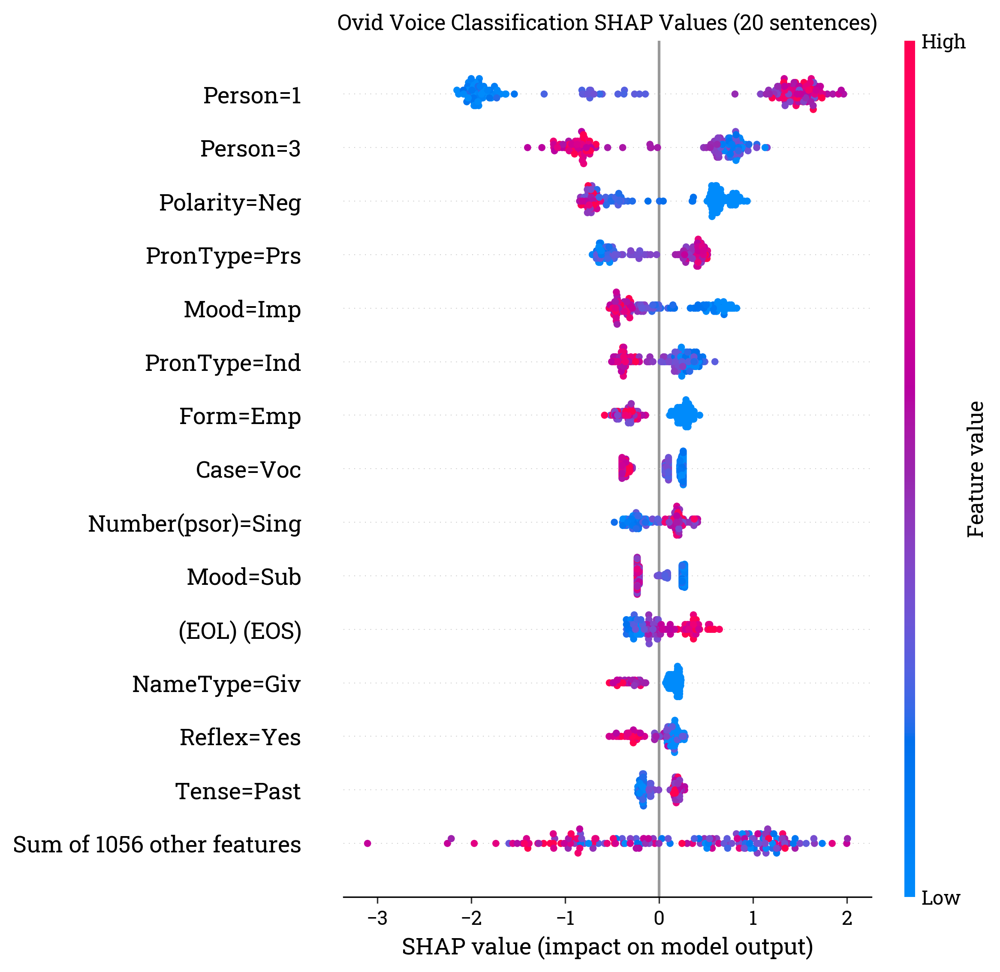

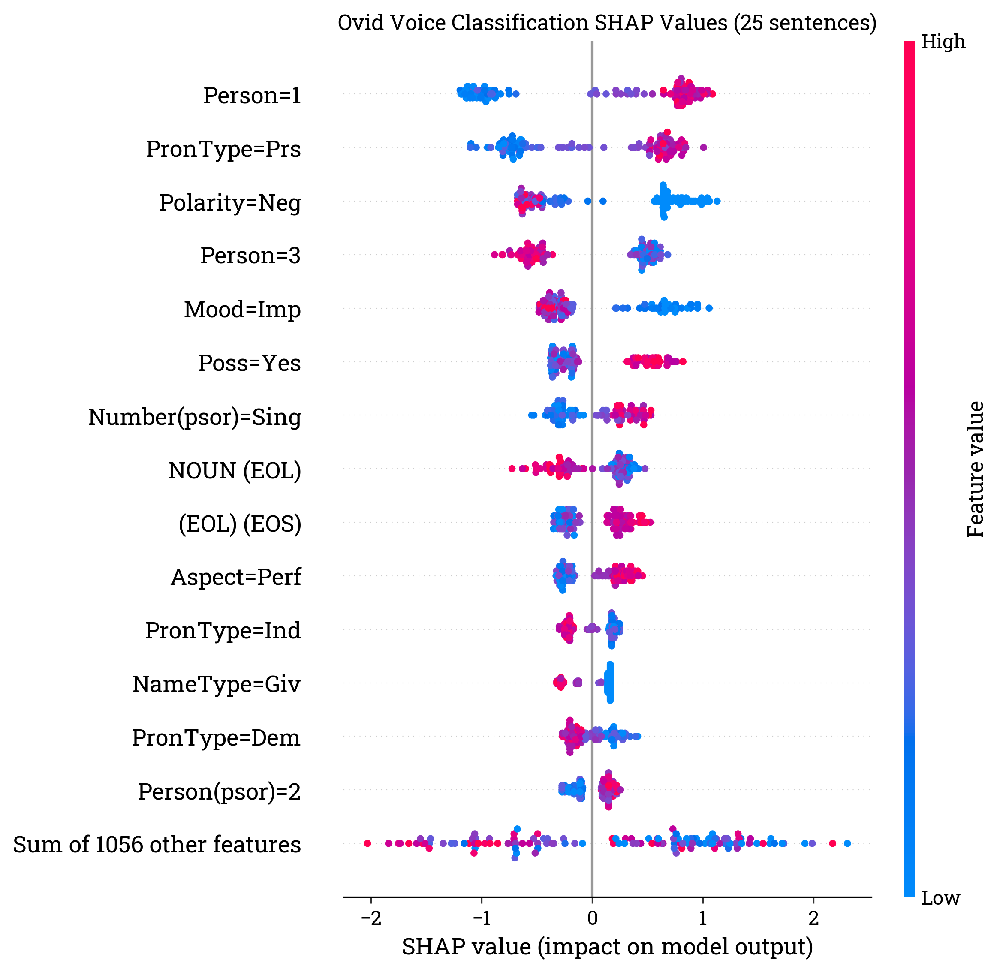

In [24]:
for squish in [1, 2, 5, 10, 20, 25]:
    explainer_xgb = shap.Explainer(
        xgb.fit(masked_corpora[squish]["X"], masked_corpora[squish]["y"])
    )
    shap_values_xgb = explainer_xgb(masked_corpora[squish]["X"])
    ax = shap.plots.beeswarm(
        shap_values_xgb, max_display=15, group_remaining_features=True, show=False
    )
    ax.tick_params(axis="x", labelcolor="black")
    ax.tick_params(axis="y", labelcolor="black")
    plt.tight_layout()
    plt.title(f"Ovid Voice Classification SHAP Values ({squish} sentences)")
    plt.show()

## Waterfall plots of individual cases

In [51]:
def sentence_waterfall(
    item: int,
    df: pd.DataFrame,
    shapvals: shap._explanation.Explanation,
    scores: pd.DataFrame,
    max_display: int = 15,
):
    title = df.iloc[item]["title"]
    speaker = df.iloc[item]["speaker"]
    score = scores.iloc[item][speaker]
    label = f"{title}: (speaker: {speaker}, prediction: {score:.2%})\n\n"
    ax = shap.plots.waterfall(shapvals[item], max_display=max_display, show=False)
    ax.set_title(
        label + df.iloc[item].text.replace("\n ", "\n") + "\n",
        loc="left",
        fontdict={"size": 18},
    )
    print(df.iloc[item].text)
    plt.show()

In [19]:
c = masked_corpora[5]["corpus"]
X = masked_corpora[5]["X"]
y, y_uniques = c["speaker"].factorize()
model = xgb.fit(X, y)

explainer_xgb = shap.Explainer(model)
shap_values_xgb = explainer_xgb(X)
score_df = pd.DataFrame(model.predict_proba(X), columns=y_uniques)
score_df.sort_values(by="male", ascending=True).head(20)

,male,female
431,0.000083,0.999917
438,0.000127,0.999873
478,0.000136,0.999864
479,0.000272,0.999728
573,0.000289,0.999711
298,0.000290,0.999710
532,0.000343,0.999657
336,0.000347,0.999653
465,0.000354,0.999646
314,0.000357,0.999643


ei mihi, pro dira paelice blanda fui!
 Adspicit immensum moles nativa profundum
 (mons fuit), aequoreis illa resistit aquis;
 hinc ego vela tuae cognovi prima carinae
 et mihi per fluctus impetus ire fuit.
 dum moror, in summa fulsit mihi purpura prora.
 pertimui: cultus non erat ille tuus.



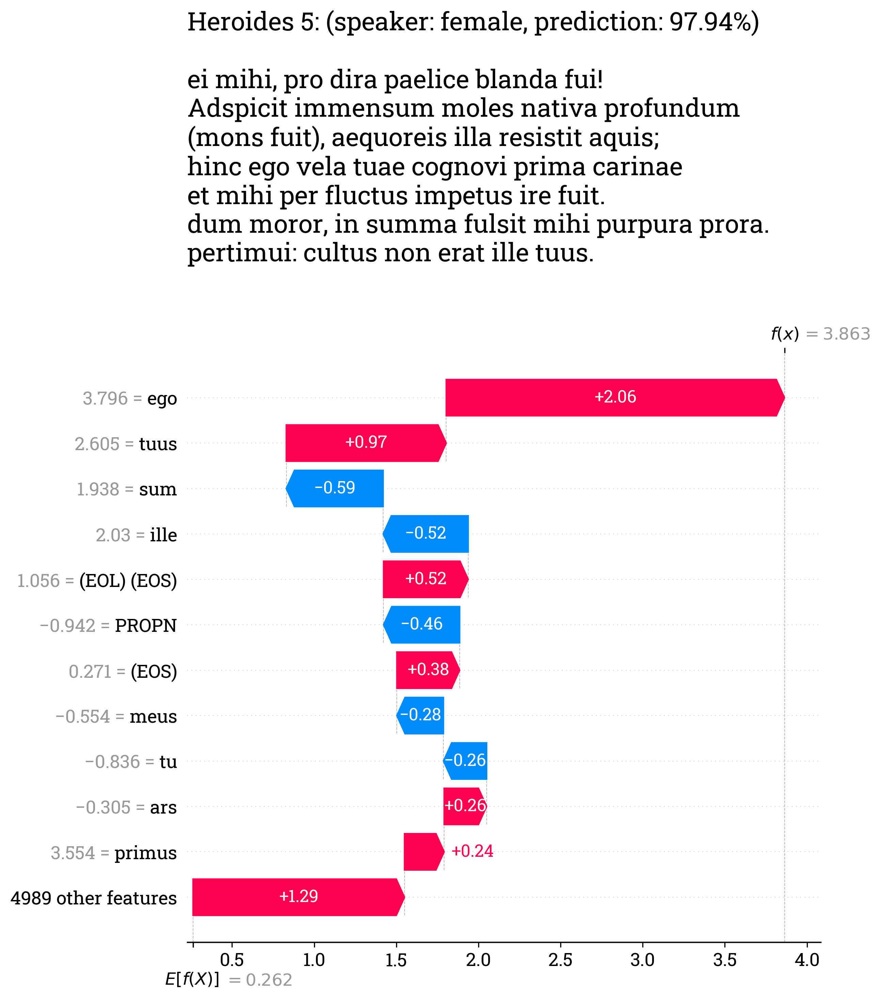

In [52]:
sentence_waterfall(478, c, shap_values_xgb, score_df, max_display=12)

In [21]:
c = masked_corpora[5]["corpus"]
X = masked_corpora[5]["X"]
y, y_uniques = c["speaker"].factorize()
model = xgb.fit(X, y)

explainer_xgb = shap.Explainer(model)
shap_values_xgb = explainer_xgb(X)
score_df = pd.DataFrame(model.predict_proba(X), columns=y_uniques)
score_df.sort_values(by="male", ascending=False).head(20)

,male,female
121,0.999909,0.000091
132,0.999804,0.000196
175,0.999775,0.000225
12,0.999700,0.000300
119,0.999613,0.000387
162,0.999591,0.000409
46,0.999590,0.000410
41,0.999577,0.000423
96,0.999565,0.000435
158,0.999478,0.000522


Hic tibi quaeratur socii sermonis origo,
 Et moveant primos publica verba sonos.
 Cujus equi veniant, facito, studiose, requiras:
 Nec mora, quisquis erit, cui favet illa, fave.
 At cum pompa frequens caelestibus ibit eburnis,
 Tu Veneri dominae plaude favente manu;
 Utque fit, in gremium pulvis si forte puellae
 Deciderit, digitis excutiendus erit:
 Etsi nullus erit pulvis, tamen excute nullum:
 Quaelibet officio causa sit apta tuo.
 Pallia si terra nimium demissa jacebunt,
 Collige, et inmunda sedulus effer humo;



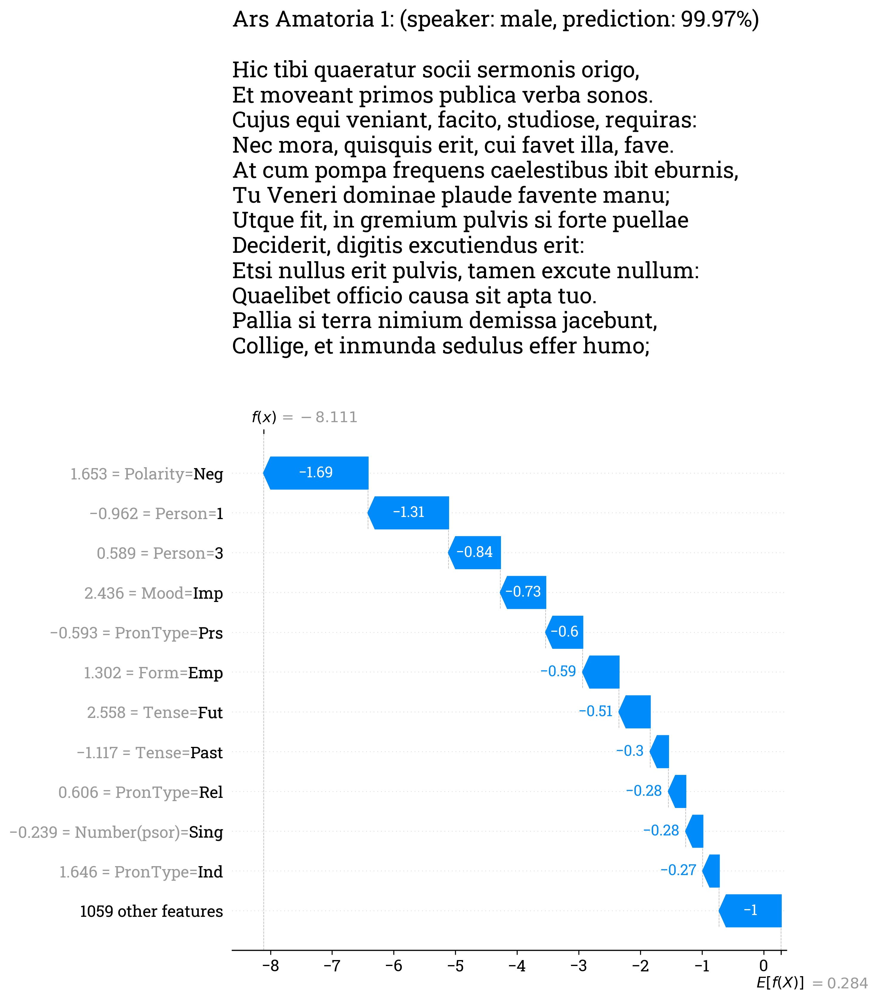

In [22]:
sentence_waterfall(12, c, shap_values_xgb, score_df, max_display=12)

## Most / Least common features to zoom in on individual features

In [29]:
def most_least(
    str: str, df: pd.DataFrame, n: int = 30, length_penalty: float = 0.02
) -> None:
    """
    Print the most and least apparent features in a DataFrame based on a specified column.

    Parameters:
    - str: The name of the column to analyze.
    - df: The DataFrame containing the data.
    - n: The number of top and bottom features to display.
    - length_penalty: A penalty factor for longer sentences, default 0.02, try between 0 and 0.1.
    """
    df = df.copy()

    def foo(r):
        print(
            f"[{r.speaker:<8} {r.title:<20}] {r.name:<5} {r[str]:.2f}\n{r.text.replace("\n ", "\n")}"
        )
        return None

    lens = df["text"].str.count(" ")
    scales = np.power(1 + length_penalty, lens)
    df[str] = df[str] / scales
    print(f"Feature: {str}, {n} most apparent")
    df.sort_values(by=str, ascending=False).head(n).apply(foo, axis=1)
    print(f"Feature: {str}, {n} least apparent")
    df.sort_values(by=str, ascending=True).head(n).apply(foo, axis=1)

In [65]:
c = bench.vectorize_squish(
    eval_df,
    fn=lemmavec,
    groups=["title"],
    start_col=3,
    squish=25,
    norm=True,
    scale=False,
).reset_index(drop=True)
most_least("ego", c, 10, length_penalty=0)

Feature: ego, 10 most apparent
[female   Heroides 17         ] 13    0.03
utque sit hoc verum, certe pars altera ficta est,
judicii pretium qua data dicor ego.
non est tanta mihi fiducia corporis, ut me
maxima teste dea dona fuisse putem.
contenta est oculis hominum mea forma probari;
laudatrix Venus est invidiosa mihi.
sed nihil infirmo; faveo quoque laudibus istis;
nam, mens, vox quare, quod cupit esse, neget?
nec tu succense nimium mihi creditus aegre;
tarda solet magnis rebus inesse fides.
prima mea est igitur Veneri placuisse voluptas;
proxima, me visam praemia summa tibi,
nec te Palladios nec te Junonis honores
auditis Helenae praeposuisse bonis.
ergo ego sum virtus, ego sum tibi nobile regnum?
ferrea sim, si non hoc ego pectus amem.
ferrea, crede mihi, non sum; sed amare repugno
illum, quem fieri vix puto posse meum.
quid bibulum curvo proscindere litus aratro
spemque sequi coner quam locus ipse negat?
sum rudis ad Veneris furtum nullaque fidelem
di mihi sunt testes! lusimus art

In [34]:
c = bench.vectorize_squish(
    train_df,
    fn=lemmavec,
    groups=["title"],
    start_col=3,
    squish=1,
    norm=True,
    scale=False,
).reset_index(drop=True)
most_least("meus", c, 10, length_penalty=0)

Feature: meus, 10 most apparent
[male     Ars Amatoria 3      ] 1071  0.25
'Redde meum!'
[female   Heroides 12         ] 1654  0.13
dos mea tu sospes, dos est mea Graia juventus.

[female   Heroides 11         ] 1521  0.12
miser admisso plectitur ille meo!

[male     Ars Amatoria 1      ] 119   0.12
numero cedet harena meo.

[male     Ars Amatoria 2      ] 648   0.12
judiciis ista venena meis;

[female   Heroides 5          ] 2373  0.12
Denique tutus amor meus est;
[female   Heroides 2          ] 2060  0.12
at mea despecti fugiunt conubia Thraces,
quod ferar externum praeposuisse meis.

[male     Ars Amatoria 2      ] 491   0.11
haec mea castra puta.

[female   Heroides 2          ] 2037  0.11
patior telis vulnera facta meis!

[female   Heroides 2          ] 2096  0.11
Inscribere meo causa invidiosa sepulcro.

Feature: meus, 10 least apparent
[male     Ars Amatoria 1      ] 0     0.00
Siquis in hoc artem populo non novit amandi,
Hoc legat et lecto carmine doctus amet.

[female   Heroid

## Clustering to see groups of related features

In [35]:
import warnings

warnings.filterwarnings("ignore")

clustering = shap.utils.hclust(
    masked_corpora[25]["X"], masked_corpora[25]["y"], linkage="average", random_state=42
)

1144901it [43:06, 441.19it/s]                              


In [38]:
import pickle

with open("shap_clustering_masked.pkl", "wb") as f:
    pickle.dump(clustering, f)

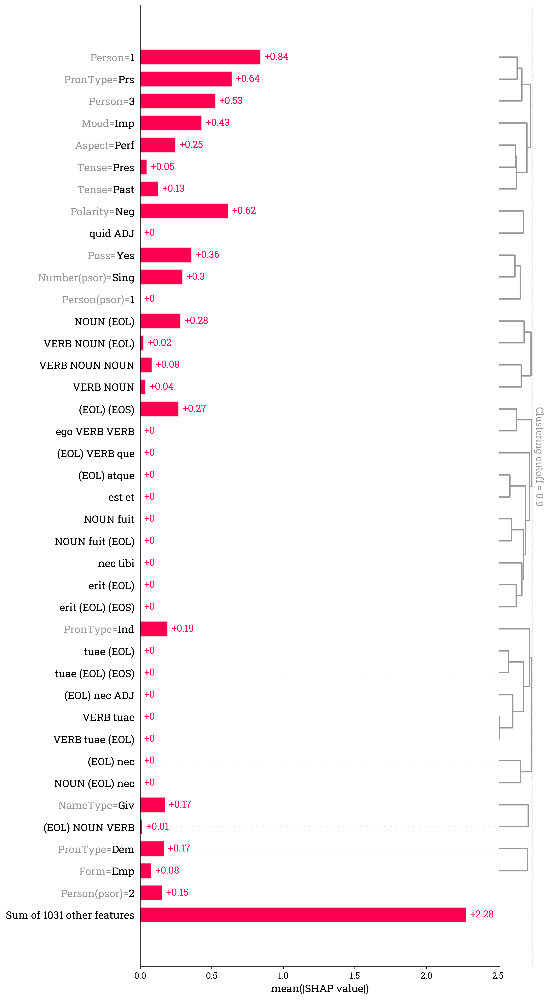

In [37]:
# clustering = shap.utils.hclust(X, y)

shap.plots.bar(
    shap_values_xgb,
    max_display=40,
    clustering=clustering,
    clustering_cutoff=0.9,
)

In [39]:
lemma_corpora = {}
for squish in [1, 2, 5, 10, 20, 25]:
    corpus = bench.vectorize_squish(
        train_df,
        fn=lemmavec,
        groups=["title"],
        start_col=3,
        squish=squish,
        norm=True,
        scale=True,
    ).reset_index(drop=True)
    (_, X, y), report = bench.bench_and_fit(
        corpus.copy(), xgb, quiet=True, y_col="speaker", start_col=4
    )
    lemma_corpora[squish] = {"corpus": corpus, "X": X, "y": y}

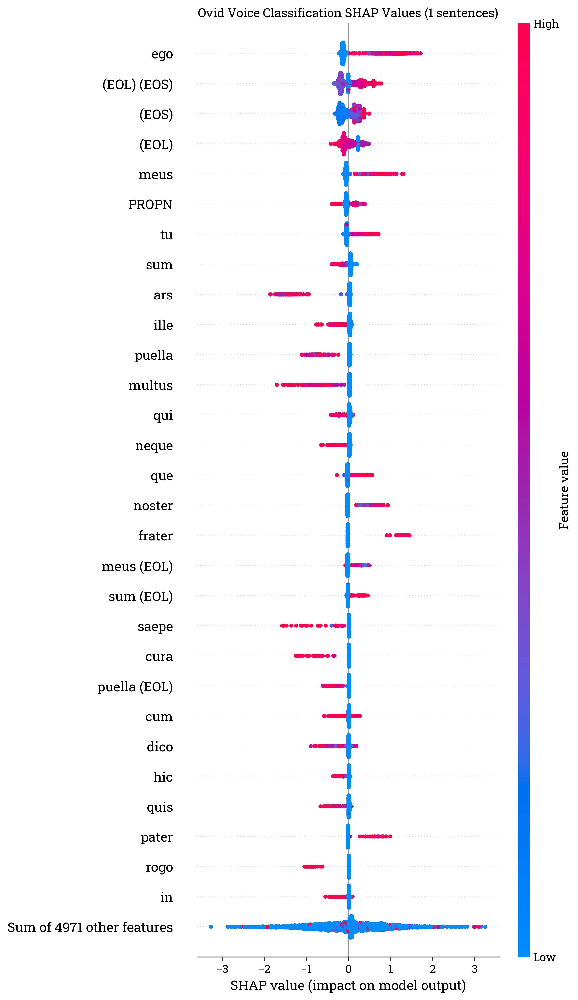

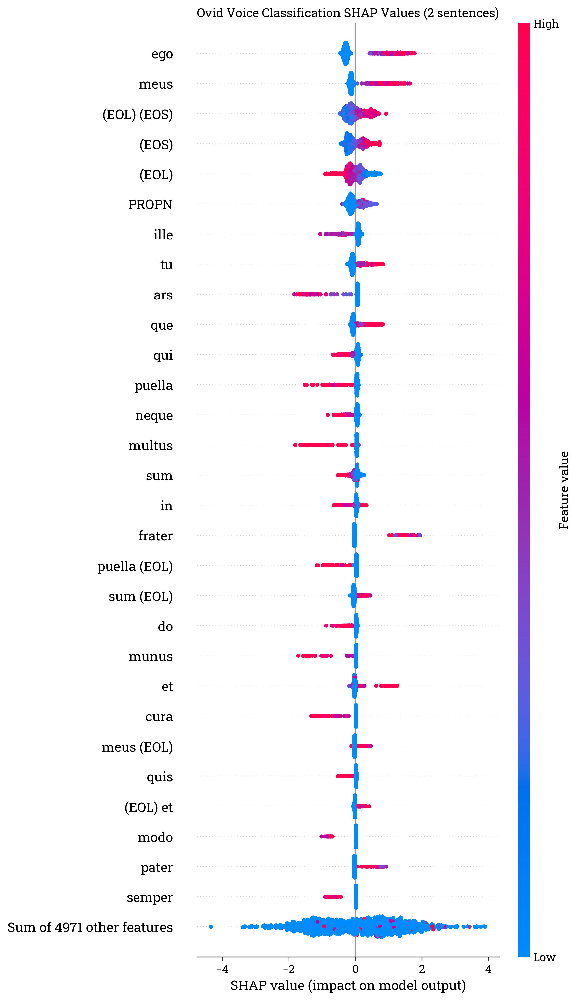

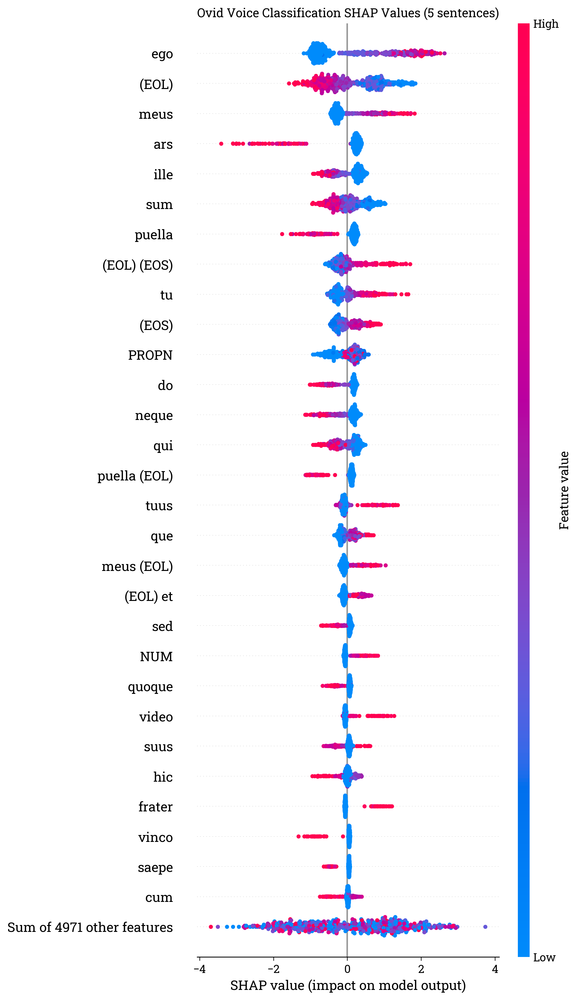

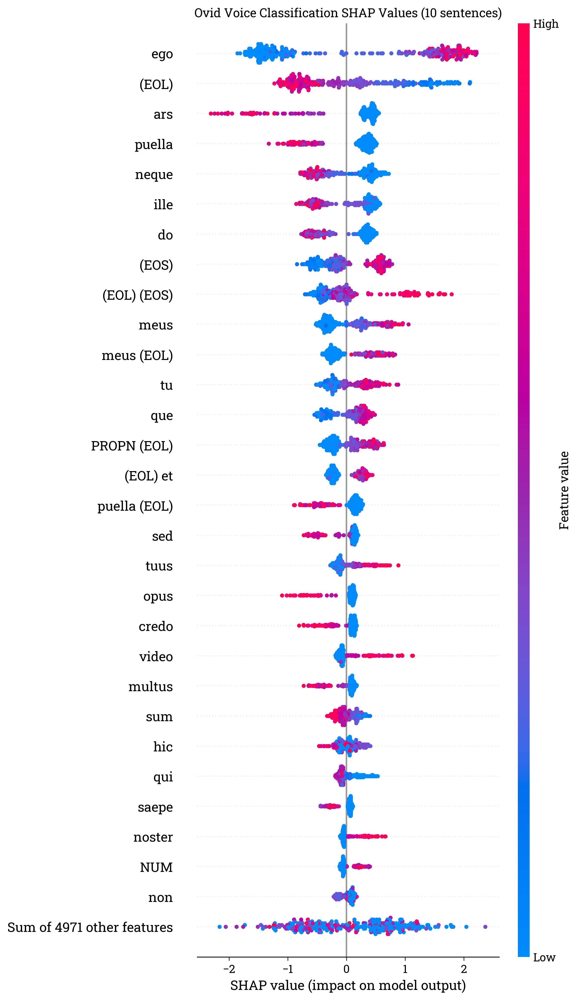

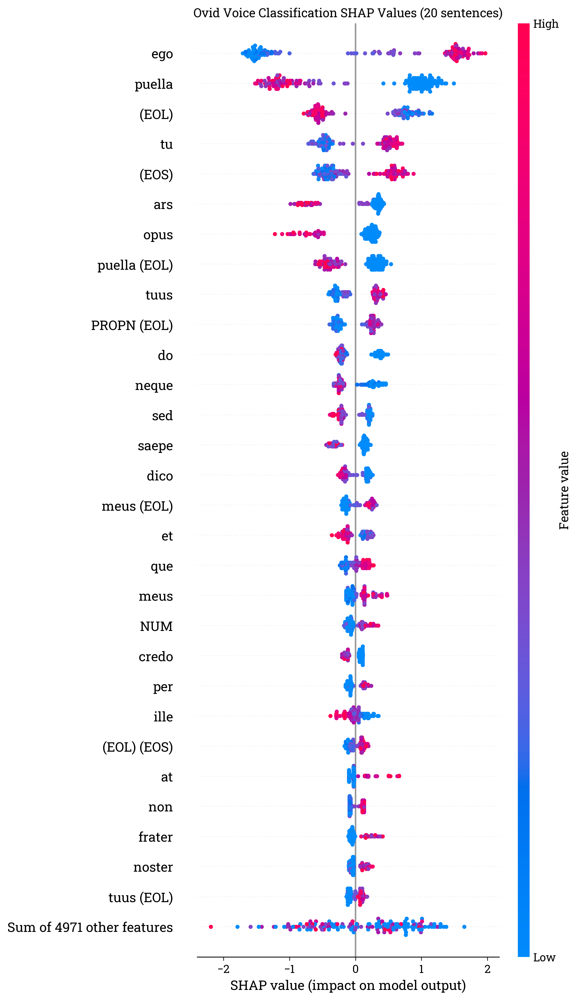

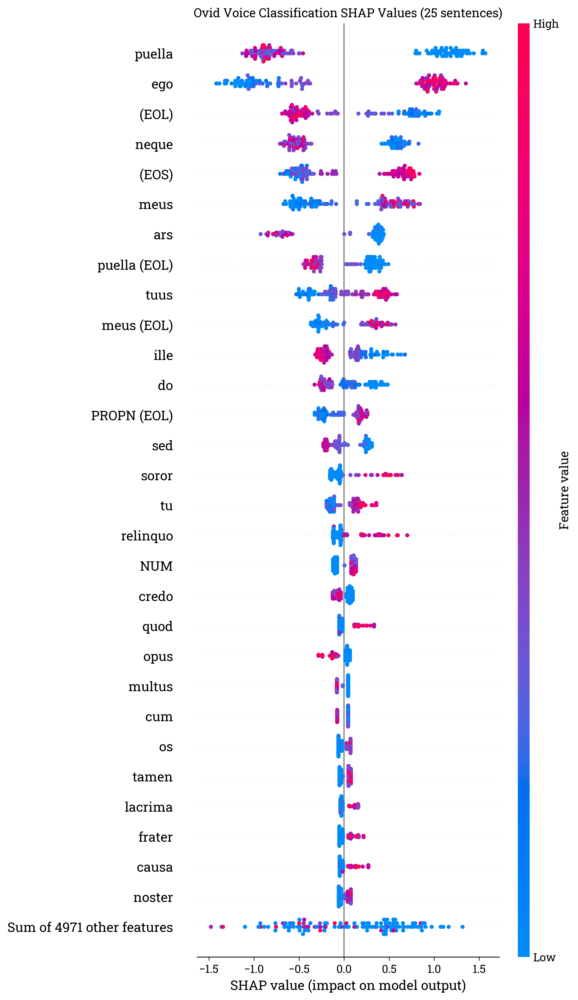

In [43]:
for squish in [1, 2, 5, 10, 20, 25]:
    explainer_xgb = shap.Explainer(
        xgb.fit(lemma_corpora[squish]["X"], lemma_corpora[squish]["y"])
    )
    shap_values_xgb = explainer_xgb(lemma_corpora[squish]["X"])
    ax = shap.plots.beeswarm(
        shap_values_xgb, max_display=30, group_remaining_features=True, show=False
    )
    ax.tick_params(axis="x", labelcolor="black")
    ax.tick_params(axis="y", labelcolor="black")
    plt.tight_layout()
    plt.title(f"Ovid Voice Classification SHAP Values ({squish} sentences)")
    plt.show()

In [56]:
c = lemma_corpora[10]["corpus"]
X = lemma_corpora[10]["X"]
y, y_uniques = c["speaker"].factorize()
model = xgb.fit(X, y)

explainer_xgb = shap.Explainer(model)
shap_values_xgb = explainer_xgb(X)
score_df = pd.DataFrame(model.predict_proba(X), columns=y_uniques)
score_df.sort_values(by="male", ascending=True).head(20)

,male,female
163,0.000416,0.999584
276,0.000432,0.999568
238,0.000462,0.999538
140,0.000510,0.999490
235,0.000517,0.999483
246,0.000558,0.999442
202,0.000569,0.999431
186,0.000974,0.999026
242,0.000988,0.999012
158,0.000997,0.999003


arbitrium neptis habebat avus.
 at pater Aeacidae promiserat inscius acti;
 plus patre, quo prior est ordine, posset avus.
 cum tibi nubebam, nulli mea taeda nocebat;
 si jungar Pyrrho, tu mihi laesus eris.
 et pater ignoscet nostro Menelaus amori;
 succubuit telis praepetis ipse dei.
 quem sibi permisit, genero concedet amorem.
 proderit exemplo mater amata suo.
 tu mihi, quod matri pater est.


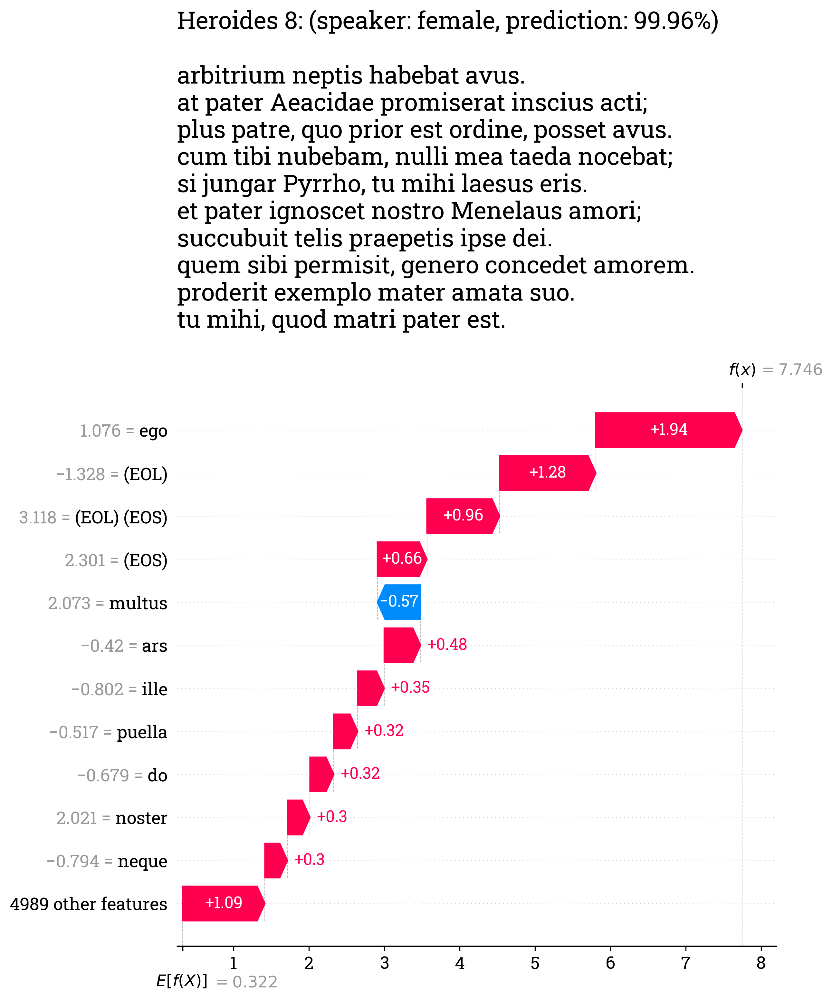

In [58]:
sentence_waterfall(276, c, shap_values_xgb, score_df, max_display=12)

In [62]:
c = lemma_corpora[10]["corpus"]
X = lemma_corpora[10]["X"]
y, y_uniques = c["speaker"].factorize()
model = xgb.fit(X, y)

explainer_xgb = shap.Explainer(model)
shap_values_xgb = explainer_xgb(X)
score_df = pd.DataFrame(model.predict_proba(X), columns=y_uniques)
score_df.sort_values(by="male", ascending=False).head(20)

,male,female
56,0.999656,0.000344
4,0.999625,0.000375
94,0.999482,0.000518
117,0.999408,0.000592
12,0.999353,0.000647
10,0.999338,0.000662
33,0.999281,0.000719
22,0.999281,0.000719
99,0.999210,0.000790
59,0.999160,0.000840


Laeta erit, et causam tibi se sciet esse pericli;
 Hoc dominae certi pignus amoris erit.
 Saepe tua poteras, Leandre, carere puella:
 Transnabas, animum nosset ut illa tuum.
 Nec pudor ancillas, ut quaeque erit ordine prima,
 Nec tibi sit servos demeruisse pudor.
 Nomine quemque suo (nulla est jactura) saluta,
 Junge tuis humiles, ambitiose, manus.
 Sed tamen et servo (levis est inpensa) roganti
 Porrige Fortunae munera parva die:
 Porrige et ancillae, qua poenas luce pependit
 Lusa maritali Gallica veste manus.
 Fac plebem, mihi crede, tuam; sit semper in illa
 Janitor et thalami qui jacet ante fores.
 Nec dominam jubeo pretioso munere dones:
 Parva, sed e parvis callidus apta dato.
 Dum bene dives ager, cum rami pondere nutant,
 Adferat in calatho rustica dona puer.



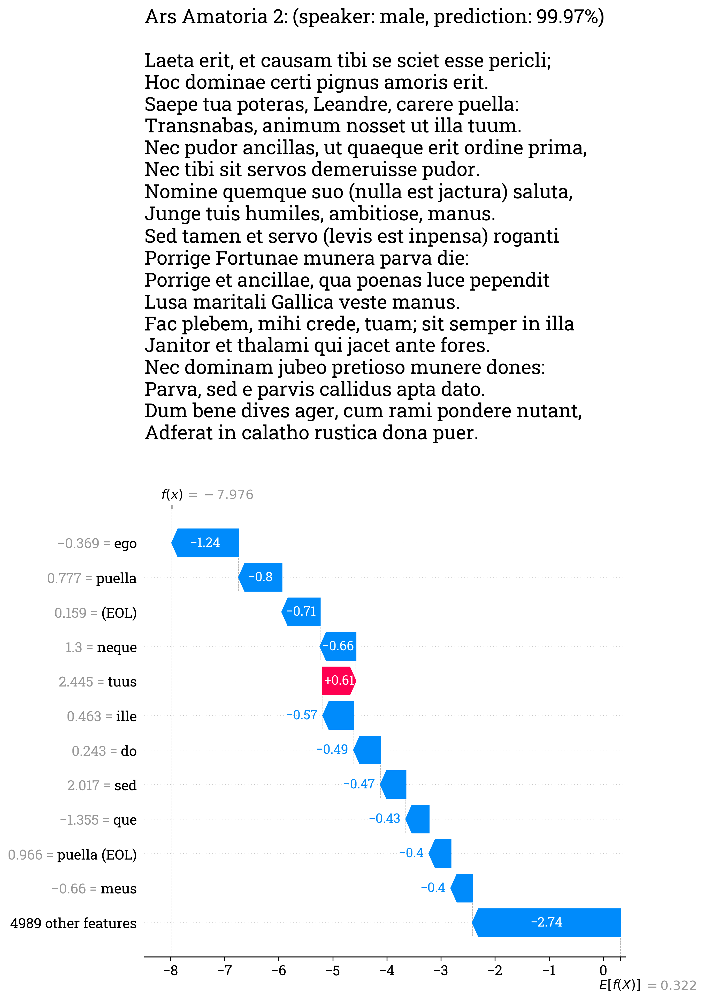

In [63]:
sentence_waterfall(56, c, shap_values_xgb, score_df, max_display=12)